In [1]:
%matplotlib inline
from skimage import io, filters
import tensorflow as tf
import tensorflow.contrib.slim as slim
from tensorflow.examples.tutorials.mnist import input_data
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os,sys
from lgan.diffeomorphism import tf_diffeomorphism
from tqdm import tqdm
from scipy import misc
from keras.preprocessing import image
from scipy import ndimage, misc

Using TensorFlow backend.


In [2]:
#PREROCESS IMAGES - only do once
def resize():
    path = '/home/ben/celeba/data/0'
    dirs = os.listdir( path )    
    for item in dirs:
        if os.path.isfile(os.path.join(path,item)):
            image = ndimage.imread(os.path.join(path,item), mode="RGB")
            image_resized = misc.imresize(image, (64, 64))
            misc.imsave('/home/ben/celeba/resized/0/'+item, image_resized)
            
def cutImages():
    path = '/home/ben/celeba/data/0'
    dirs = os.listdir( path )    
    for item in dirs:
        if os.path.isfile(os.path.join(path,item)):
            inread = ndimage.imread(os.path.join(path,item), mode="RGB")
            image_cut = inread[40:178,20:158,:] #cut image:218x179->138x138
            image_resized = misc.imresize(image_cut, (64, 64))
            misc.imsave('/home/ben/celeba/cut/0/'+item, image_resized)
            


#resize()
#cutImages()
print(len(os.listdir("/home/ben/celeba/cut/0")))

202599


In [3]:
#hyper-parameter
data_size = 202599
batch_size = 32 #batch size
input_dim = 128 #dim http://localhost:8889/notebooks/MyGans/LabelGAN/LabelGAN-celebA.ipynb#x and z input_size
image_size = 4096
attribute_size = 40
imX= 64
imY= 64
LAMBDA = 10
output_dim = imX*imY*3

#Session
config = tf.ConfigProto()
config.gpu_options.allow_growth=True
sess = tf.Session(config=config)


In [4]:
datagen = image.ImageDataGenerator(rescale=1./255)

batcher = datagen.flow_from_directory(
    directory='/home/ben/celeba/cut',
    target_size= (64, 64),
    color_mode= 'rgb',
    class_mode= None,
    batch_size= batch_size)

Found 202599 images belonging to 1 classes.


In [5]:
#annotations
def createAttributes():
    attr_file = open('/home/ben/celeba/Anno/list_attr_celeba.txt', "r")
    attributes = np.zeros((data_size,attribute_size))
    attrList = attr_file.readline() #get different attributes
    attrList = attrList.split(" ")[0:attribute_size] #40 annotations

    for i in range(data_size):
        a = attr_file.readline()
        a = a.split(" ")
        a = np.array(list(filter(lambda x:x!="",a))) #filter empty strings
        a = np.array(list(map(float, a[1:attribute_size+1])))
        attributes[i]=a
    return (attributes, attrList)

attributes, attrList = createAttributes()
print(len(attributes))  


202599


In [6]:
print(attrList)

['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive', 'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose', 'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair', 'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee', 'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie', 'Young']


In [7]:
#simple plot function
def plot(samples, labels,y,x):
    fig = plt.figure(figsize=(10, 10))
    gs = gridspec.GridSpec(y, x)
    gs.update(wspace=0.05, hspace=0.05)
    plt.subplots_adjust(left=None, bottom=None, right=1, top=1.5,
                wspace=None, hspace=None)

    for i, sample in enumerate(samples):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.title(labels[i])
        plt.imshow(sample)   
    return fig

In [8]:
def getImageBatch():
    img_batch = batcher.next()
    if len(img_batch) != batch_size:
        img_batch = batcher.next()
    assert len(img_batch) == batch_size
    return img_batch

/home/dorian/.local/lib/python3.5/site-packages/matplotlib/figure.py:402: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


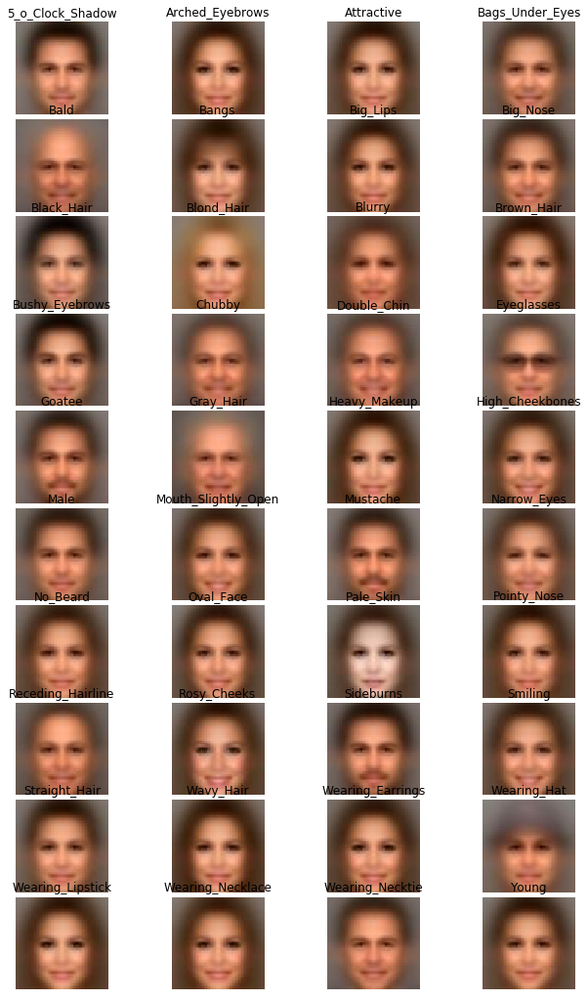

In [9]:
#creating mean images
def createMeanImages(create=True):
    meanImages = np.zeros((attribute_size, imY,imX,3))
    meanImageCount = np.zeros(attribute_size)
    mean_path = '/home/ben/celeba/mean/0/'
    mean_dir = sorted(os.listdir(mean_path))
    path = '/home/ben/celeba/cut/0'
    dirs = os.listdir( path )  
    if create:
        for i, item in  enumerate(dirs):
            if os.path.isfile(os.path.join(path,item)):
                position = str.split(item,".")
                index = (int(position[0]))-1
                image = ndimage.imread(os.path.join(path,item), mode="RGB")/255
                positiv = np.argwhere(attributes[index]==1)
                meanImages[positiv]+=image
                meanImageCount[positiv] +=1           

        for j in range(attribute_size):
            meanImages[j] = meanImages[j]/meanImageCount[j]
            misc.imsave('/home/ben/celeba/mean/0/'+attrList[j]+'.jpg', meanImages[j])  
        return (meanImages, meanImageCount)
    else:
        for i, item in  enumerate(mean_dir): 
            meanImages[i]=ndimage.imread(os.path.join(mean_path,item), mode="RGB")/255
        return (meanImages,[])
        
meanImages, meanImageCount = createMeanImages(False) 
f = plot(meanImages, attrList, 10,4)
f.show()


In [10]:
'''
#try Diffeomorphism
image = meanImages
print(image.shape)
session = tf.InteractiveSession()
diff_map =  np.random.uniform(-0.1,0.1, size=(40,8, 8, 2)) #batch_size, diff_height, diff_width, 2
dif_image = tf_diffeomorphism(image,diff_map)
p = plot(image,attrList,10,4)
p.show()
div_image = dif_image.eval()
p2 =plot(div_image,attrList,10,4)
p2.show()
'''

'\n#try Diffeomorphism\nimage = meanImages\nprint(image.shape)\nsession = tf.InteractiveSession()\ndiff_map =  np.random.uniform(-0.1,0.1, size=(40,8, 8, 2)) #batch_size, diff_height, diff_width, 2\ndif_image = tf_diffeomorphism(image,diff_map)\np = plot(image,attrList,10,4)\np.show()\ndiv_image = dif_image.eval()\np2 =plot(div_image,attrList,10,4)\np2.show()\n'

Nummer: 133475
['Bald', 'Big_Lips', 'Big_Nose', 'Goatee', 'Male', 'Mouth_Slightly_Open', 'Oval_Face', 'Young']


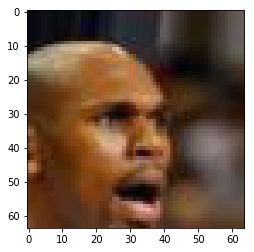

Nummer: 099363
['Bags_Under_Eyes', 'Brown_Hair', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Oval_Face', 'Smiling', 'Young']


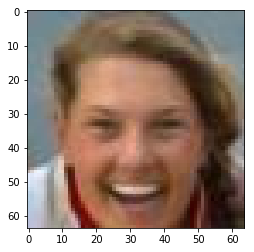

Nummer: 182881
['Attractive', 'Bags_Under_Eyes', 'Big_Lips', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Pointy_Nose', 'Smiling', 'Wavy_Hair', 'Wearing_Lipstick', 'Young']


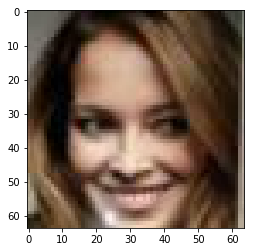

Nummer: 113913
['5_o_Clock_Shadow', 'Bags_Under_Eyes', 'Big_Nose', 'High_Cheekbones', 'Male', 'Mouth_Slightly_Open', 'Smiling', 'Wearing_Hat']


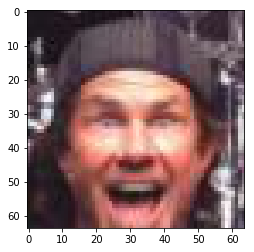

Nummer: 100818
['Attractive', 'Bangs', 'Black_Hair', 'Heavy_Makeup', 'No_Beard', 'Oval_Face', 'Smiling', 'Straight_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Wearing_Necklace', 'Young']


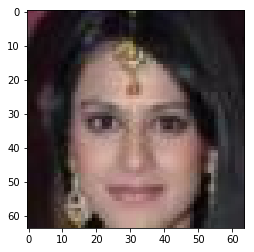

Nummer: 186684
['Blond_Hair', 'High_Cheekbones', 'Mouth_Slightly_Open', 'Narrow_Eyes', 'No_Beard', 'Pointy_Nose', 'Smiling', 'Wearing_Lipstick', 'Wearing_Necklace', 'Young']


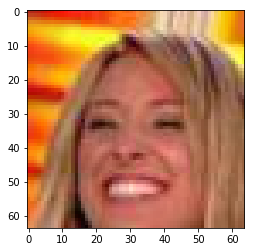

Nummer: 126381
['Arched_Eyebrows', 'Black_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Oval_Face', 'Receding_Hairline', 'Smiling', 'Wearing_Lipstick', 'Young']


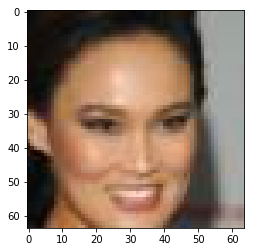

Nummer: 074330
['Arched_Eyebrows', 'Attractive', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Rosy_Cheeks', 'Smiling', 'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Lipstick', 'Young']


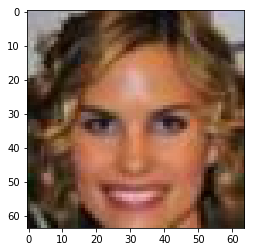

Nummer: 158681
['Bags_Under_Eyes', 'Big_Nose', 'Brown_Hair', 'High_Cheekbones', 'Male', 'No_Beard', 'Smiling', 'Wavy_Hair']


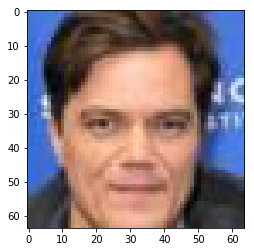

Nummer: 159670
['Arched_Eyebrows', 'Attractive', 'Blond_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Mouth_Slightly_Open', 'No_Beard', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Smiling', 'Wearing_Earrings', 'Wearing_Lipstick']


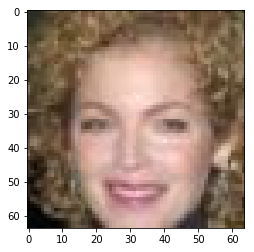

In [11]:
#show some images with label
def showLabelImages():
    path = '/home/ben/celeba/cut/0'
    dirs = os.listdir( path )  
    dirs = dirs[0:10]
    for i, item in  enumerate(dirs):
        if os.path.isfile(os.path.join(path,item)):
            position = str.split(item,".")
            index = (int(position[0]))-1
            image = ndimage.imread(os.path.join(path,item), mode="RGB")/255
            p = np.argwhere(attributes[index]==1)
            p = p.reshape(len(p))
            print("Nummer: "+position[0])
            attribute = []
            for i in range(len(p)):
                index = int(p[i])
                attribute.append(attrList[p[i]])
            print(attribute)
            plt.imshow(image)
            plt.show()

showLabelImages()

In [12]:
#toDO -how to do means`?
def getMeanImage(batch_size):
    indexes = (np.random.rand(batch_size)*40).astype(int)
    attr = np.zeros((batch_size,attribute_size))
    images= meanImages[indexes]
    for i in range(batch_size):
        attr[i,indexes[i]]=1
    return images, attr

In [13]:
def sample_z(batch_size):
    batch = np.zeros((batch_size,input_dim))
    for i in range(batch_size):
        vector = np.random.uniform(-1., 1., size=[input_dim]) #create noise vector of 128
        batch[i] = vector
    return batch


In [14]:
def createAttributesFromVector(attr_vector):
    attr=[]
    for i in range(len(attr_vector)):
        index = int(np.argwhere(attr_vector[i]==1))
        attr.append(attrList[index])
    return attr

In [15]:
def convLayer(layerinput, maps, kernel, stride, act="relu"):
    layerinput = slim.conv2d(layerinput, maps, kernel,stride, weights_initializer=tf.truncated_normal_initializer(stddev=1e-1),
                  padding = 'SAME',activation_fn=None)
    if(act == "tanh"):        
        return tf.nn.tanh(layerinput)
    elif(act =="leakyReLU"):
        return leakyReLU(layerinput)
    elif(act =="None"):
        return layerinput
    else:
        layerinput = slim.batch_norm(layerinput)
        return tf.nn.relu(layerinput) 
    
def leakyReLU(x, alpha=0.2):
    return tf.maximum(alpha*x, x)

def resnet_block(inputs, maps=64, kernel=[3, 3],stride=1):
    layer = slim.conv2d(inputs, maps, kernel, stride,weights_initializer=tf.truncated_normal_initializer(stddev=1e-1),
                  padding = 'SAME',activation_fn=None)
    layer = slim.batch_norm(layer)
    layer = tf.nn.relu(layer)
    layer = slim.conv2d(layer, maps, kernel, stride,weights_initializer=tf.truncated_normal_initializer(stddev=1e-1),
                  padding = 'SAME',activation_fn=None)
    layer = tf.nn.relu(layer)
    layer = slim.batch_norm(layer)
    outputs = tf.add(inputs, layer)
    return outputs

In [16]:
#Generator Variables
scalar = tf.Variable(tf.reduce_mean(tf.random_normal([1], stddev=0.01)))
multMatrix = tf.Variable(tf.random_normal([batch_size,2,256], stddev=1))

#Generator - add Detail
def generator_detail(dif_image,noise):
    with tf.variable_scope('generator_detail'):
        noise = tf.reshape(noise, (batch_size,64,2))
        noise = tf.matmul(noise, multMatrix) 
        noise = tf.reshape(noise,(batch_size, 32,32,16))
        #noise = slim.batch_norm(noise)
        #noise = tf.scalar_mul(scalar, noise)

        #details = tf.reshape(dif_image, [batch_size, 64,64,3])
        #details = convLayer(details, 16, [3,3],2)
        
        #detail_image = tf.add(details, noise)
        detail_image = convLayer(noise, 512, [9,9],8)
        detail_image = slim.convolution2d_transpose(detail_image,256, [3,3],2)
        detail_image = slim.batch_norm(detail_image)
        detail_image = tf.nn.relu(detail_image)
        detail_image = slim.convolution2d_transpose(detail_image, 128, [3,3],2)
        detail_image = slim.batch_norm(detail_image)
        detail_image = tf.nn.relu(detail_image)        
        detail_image = slim.convolution2d_transpose(detail_image, 64, [3,3],2)
        detail_image = slim.batch_norm(detail_image)
        detail_image = tf.nn.relu(detail_image)
        detail_image = slim.convolution2d_transpose(detail_image, 3, [3,3],2) 
        detail_image = tf.nn.tanh(detail_image)

        return detail_image
''' 
#Generator - predict parameters for Diffeomorphism
def generator_dif_paras(noise_vector):
    with tf.variable_scope('generator_diffeo'):
        params = tf.reshape(noise_vector,[batch_size,8,8,2])
        params = convLayer(params, 32, [3, 3],1)  
        params = convLayer(params, 16, [3, 3],1)
        params = convLayer(params, 2, [3, 3],1,act="tanh")

        params= tf.reshape(params, [batch_size,8,8,2]) 
        return params
'''  
#Main Generator
def generator(z, mean_image,class_z):
    with tf.variable_scope('generator'):
        mean_image = tf.reshape(mean_image,[batch_size, imY,imX,3])
        class_z = slim.fully_connected(class_z, input_dim,weights_initializer=tf.truncated_normal_initializer(stddev=1e-1))
        class_z = tf.nn.relu(class_z)
        noise = tf.multiply(z,class_z)
        
        #dif_params = generator_dif_paras(noise)
        #dif_image = tf_diffeomorphism(mean_image,dif_params) 
        #detailed_image = generator_detail(noise, dif_image)
        detailed_image = generator_detail(mean_image, noise)
        return [detailed_image,mean_image]



In [17]:
#v1 fully conv
def discriminator(x):
    with tf.variable_scope('discriminator'):
        x = tf.reshape(x,[batch_size,imY,imX,3])
        net = slim.conv2d(x, 16, [4, 4],2, weights_initializer=tf.truncated_normal_initializer(stddev=0.1),
                         padding = 'SAME',activation_fn=None)
        net = leakyReLU(net)
        net = slim.conv2d(x, 32, [3, 3],2, weights_initializer=tf.truncated_normal_initializer(stddev=0.1),
                         padding = 'SAME',activation_fn=None)
        net = leakyReLU(net)
        net = slim.conv2d(net, 128, [3, 3],2,weights_initializer=tf.truncated_normal_initializer(stddev=0.1),
                         padding = 'SAME',activation_fn=None)
        net = leakyReLU(net)
        net = slim.conv2d(net, 128, [3, 3],1,weights_initializer=tf.truncated_normal_initializer(stddev=0.1),
                         padding = 'SAME',activation_fn=None)
        net = leakyReLU(net)
        net = slim.conv2d(net, 256, [5, 5],1,weights_initializer=tf.truncated_normal_initializer(stddev=0.1),
                         padding = 'SAME',activation_fn=None)
        net = leakyReLU(net)
        net = slim.conv2d(net, 512, [3, 3],2,weights_initializer=tf.truncated_normal_initializer(stddev=0.1),
                         padding = 'SAME',activation_fn=None)
        net = leakyReLU(net)
        net = slim.conv2d(net, 512, [3,3],1,weights_initializer=tf.truncated_normal_initializer(stddev=0.1),
                         padding = 'SAME',activation_fn=None) 
        net = leakyReLU(net)
        net = slim.conv2d(net, 1024, [3,3],2,weights_initializer=tf.truncated_normal_initializer(stddev=0.1),
                         padding = 'SAME',activation_fn=None) 
        net = leakyReLU(net)
        net = slim.conv2d(net, 1, [2,2],2,weights_initializer=tf.truncated_normal_initializer(stddev=0.1),
                         padding = 'SAME',activation_fn=None)       
        return net

In [18]:

def simGenerator(image, noise):
    #with tf.variable_scope('sim-generator'):
    image = tf.reshape(image,[batch_size,imY,imX,3])
    noise = slim.fully_connected(noise, 12288,weights_initializer=tf.truncated_normal_initializer(stddev=0.1))
    noise = tf.nn.tanh(noise)
    noise = tf.reshape(noise, [batch_size,imY,imX,3])
    net = tf.concat([image, noise], 0)
    net = convLayer(image, 64, [3,3],1)
    net = resnet_block(net, maps=64, kernel=[3, 3],stride=1)
    net = resnet_block(net, maps=64, kernel=[3, 3],stride=1)
    net = resnet_block(net, maps=64, kernel=[3, 3],stride=1)
    net = resnet_block(net, maps=64, kernel=[3, 3],stride=1)
    net = resnet_block(net, maps=64, kernel=[3, 3],stride=1)
    #net = convLayer(net, 64,[3,3],1)
    net = convLayer(net, 3, [1,1],1,act="None")
    return tf.nn.sigmoid(net)


In [19]:
#input
Mean_image = tf.placeholder(tf.float32, shape=[batch_size, imY,imX,3])
X = tf.placeholder(tf.float32, shape=[batch_size,imY,imX,3]) 
Z = tf.placeholder(tf.float32, shape=[batch_size, input_dim]) #random Noise 128
Class_z = tf.placeholder(tf.float32, shape=[batch_size, attribute_size]) #class(label) of image

#Models
detail_image = generator(Z, Mean_image,Class_z) 
D_real = discriminator(X)
D_fake = discriminator(detail_image[0])

#variables V1
theta_D = sess.graph.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, 'discriminator') 
theta_G = sess.graph.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, 'generator')


D_losses, G_losses = [],[]

D_loss = tf.reduce_mean(D_fake) - tf.reduce_mean(D_real)
#added simple L1 Loss.
G_l1_loss = tf.reduce_sum(tf.abs(detail_image[0]-detail_image[1]))
G_loss = -tf.reduce_mean(D_fake)

#improved WGAN without weight clipping. Instead penalizing gradient 
alpha = tf.random_uniform(shape=[batch_size,1], minval=0.,maxval=1.)

differences = tf.reshape(detail_image[0] - X, (batch_size, output_dim))
interpolates = tf.reshape(X,(batch_size, output_dim)) + (alpha*differences)
interpolates = tf.reshape(interpolates, (batch_size, 64,64,3))
gradients = tf.gradients(discriminator(interpolates), [interpolates])[0]
slopes = tf.sqrt(tf.reduce_sum(tf.square(gradients), reduction_indices=[1]))
gradient_penalty = tf.reduce_mean((slopes-1.)**2)
D_loss += LAMBDA*gradient_penalty

G_losses.append(G_loss)
D_losses.append(D_loss)

G_loss = tf.add_n(G_losses)
D_loss = tf.add_n(D_losses) 

#Solver
D_solver = (tf.train.AdamOptimizer(learning_rate=0.0001, beta1=0.5, beta2=0.9)
            .minimize(D_loss, var_list=theta_D, colocate_gradients_with_ops=True))
G_solver = (tf.train.AdamOptimizer(learning_rate=0.0001, beta1=0.5, beta2=0.9)
            .minimize(G_loss, var_list=theta_G, colocate_gradients_with_ops=True))
G_solver_L1 = (tf.train.AdamOptimizer(learning_rate=0.0001, beta1=0.5, beta2=0.9)
            .minimize(G_l1_loss, var_list=theta_G, colocate_gradients_with_ops=True))


if not os.path.exists('out-celebA/'):
    os.makedirs('out-celebA/')

#initalize Variables    
sess.run(tf.global_variables_initializer())    

In [20]:
'''
logs_path = 'logs/lgan-log'

if not os.path.exists('logs/'):
    os.makedirs('logs/')
#Instantiate Tensorboard

# Create a summary to monitor cost tensor
tf.summary.scalar("D-loss", D_loss)
# Create a summary to monitor accuracy tensor
tf.summary.scalar("G-loss", G_loss)
# Merge all summaries into a single op
merged_summary_op = tf.summary.merge_all()

summary_writer = tf.summary.FileWriter(logs_path, graph=tf.get_default_graph())
'''

'\nlogs_path = \'logs/lgan-log\'\n\nif not os.path.exists(\'logs/\'):\n    os.makedirs(\'logs/\')\n#Instantiate Tensorboard\n\n# Create a summary to monitor cost tensor\ntf.summary.scalar("D-loss", D_loss)\n# Create a summary to monitor accuracy tensor\ntf.summary.scalar("G-loss", G_loss)\n# Merge all summaries into a single op\nmerged_summary_op = tf.summary.merge_all()\n\nsummary_writer = tf.summary.FileWriter(logs_path, graph=tf.get_default_graph())\n'

In [21]:

#pretrain gen with L1 Loss:
for t in tqdm(range(1)): 
    z = sample_z(batch_size) #get Image Batch+Labels
    mean_image,attr = getMeanImage(batch_size) #get mean_image
    _, G_loss_curr = sess.run(
        [G_solver_L1, G_loss],
        feed_dict={Z:z, Mean_image:mean_image,Class_z:attr}
    )


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


In [ ]:
#pretrain disc:
for t in tqdm(range(100)):
    #train discriminator
    Xdata = getImageBatch()
    z = sample_z(batch_size) #get Image Batch+Labels
    mean_image,attr = getMeanImage(batch_size) #get mean_image
    _, D_loss_curr = sess.run(
        [D_solver, D_loss],
        feed_dict={X: Xdata, Z:z, Mean_image:mean_image, Class_z:attr}
    ) 

100%|██████████| 100/100 [00:20<00:00,  5.07it/s]


Iter: 0; D loss: 3.181e+03; G_loss: -116.7


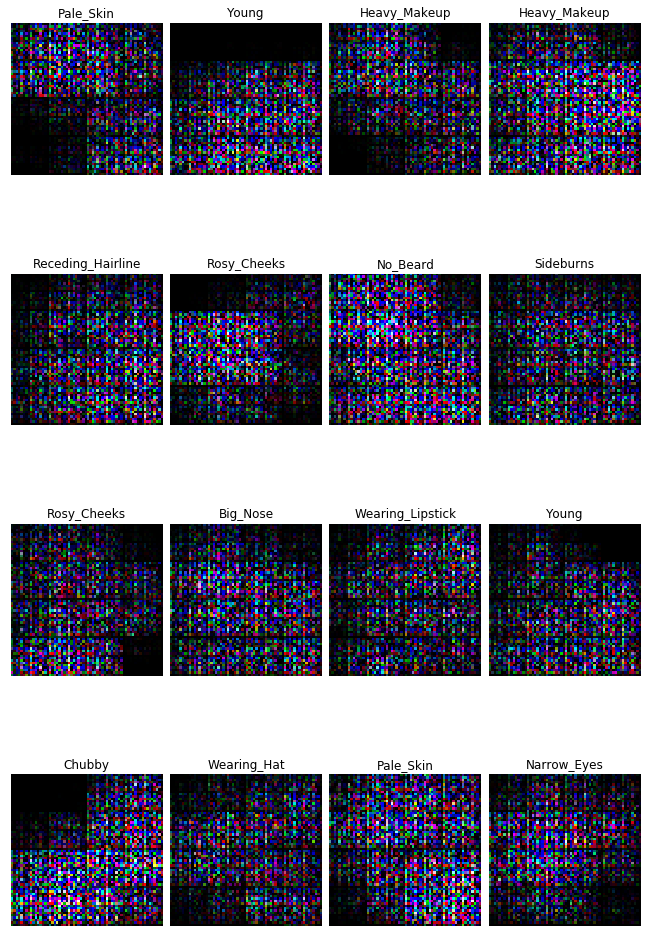

Iter: 100; D loss: 25.76; G_loss: -214.6


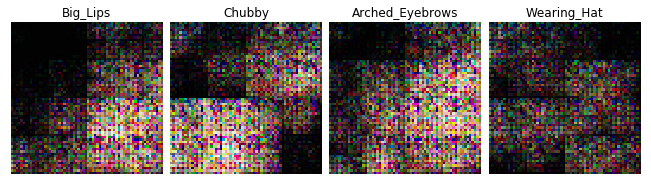

Iter: 200; D loss: -77.11; G_loss: -98.86


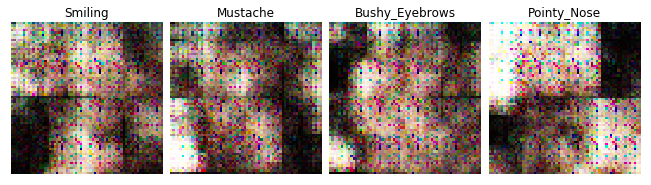

Iter: 300; D loss: -97.36; G_loss: -77.11


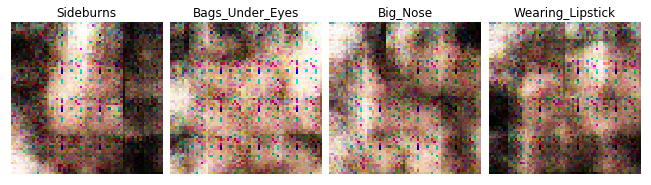

Iter: 400; D loss: -65.76; G_loss: -94.6


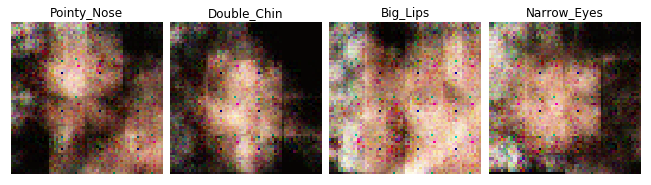

Iter: 500; D loss: -60.92; G_loss: -134.7


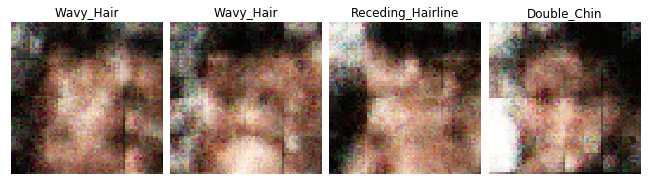

Iter: 600; D loss: -43.16; G_loss: -64.31


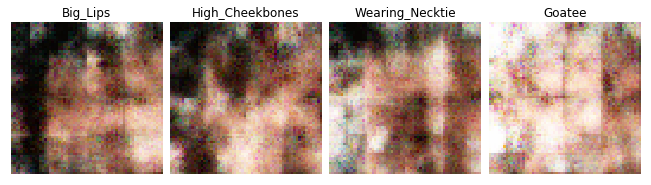

Iter: 700; D loss: -60.01; G_loss: -74.39


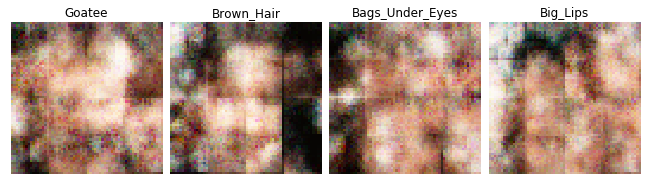

Iter: 800; D loss: -52.12; G_loss: -78.97


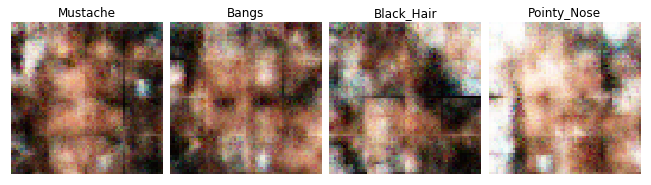

Iter: 900; D loss: -54.61; G_loss: -16.92


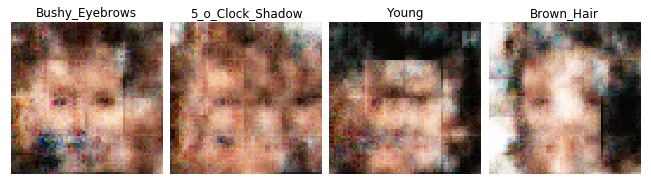

Iter: 1000; D loss: -63.05; G_loss: -44.2


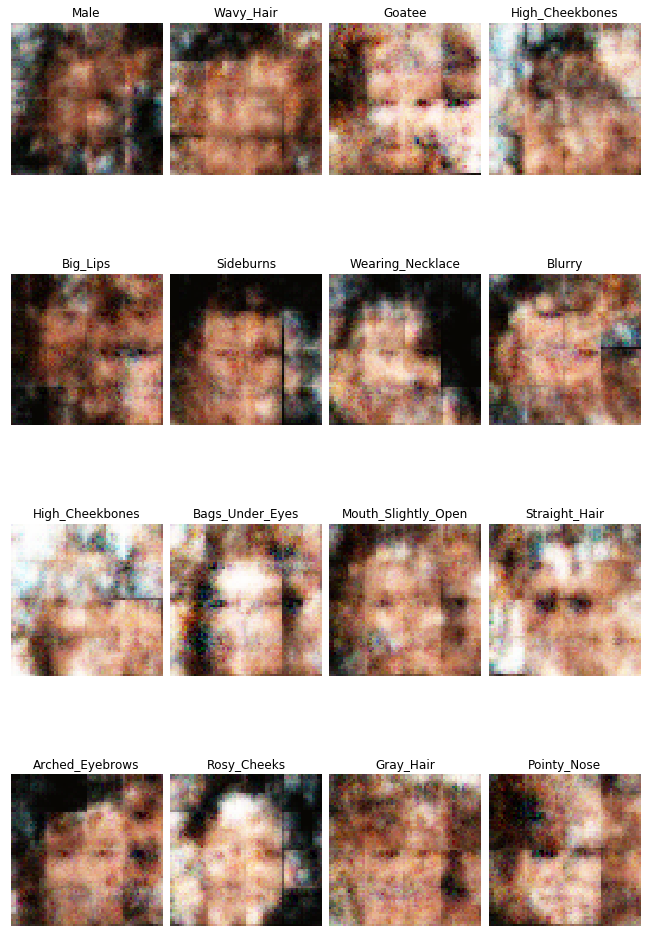

Iter: 1100; D loss: -58.87; G_loss: -71.63


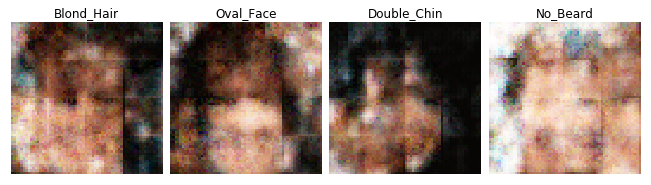

Iter: 1200; D loss: -44.94; G_loss: -53.72


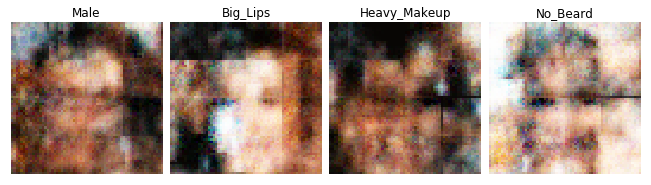

Iter: 1300; D loss: -44.54; G_loss: -46.82


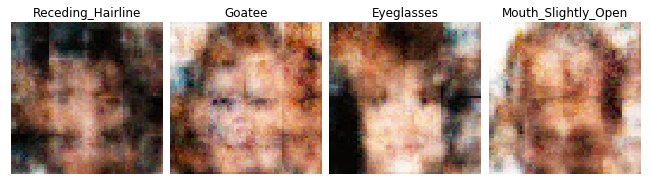

Iter: 1400; D loss: -40.04; G_loss: 29.24


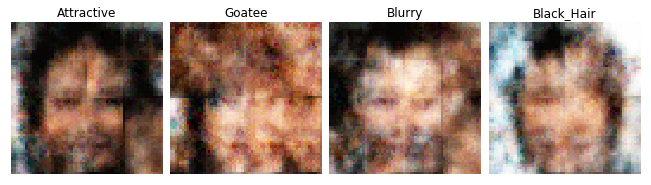

Iter: 1500; D loss: -54.65; G_loss: 69.7


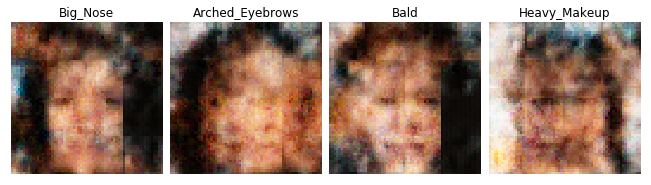

Iter: 1600; D loss: -31.78; G_loss: 18.07


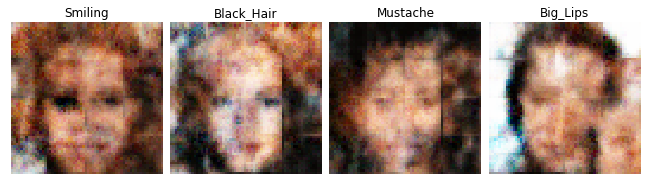

Iter: 1700; D loss: -40.64; G_loss: 0.4273


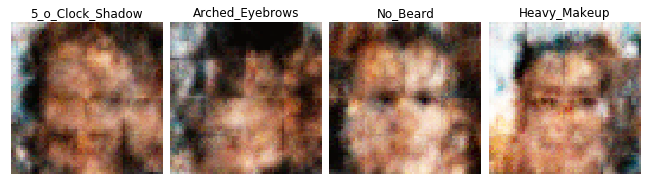

Iter: 1800; D loss: -52.64; G_loss: 9.771


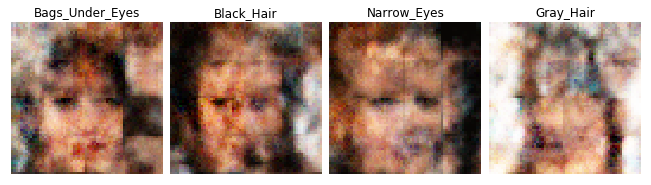

Iter: 1900; D loss: -37.42; G_loss: 21.54


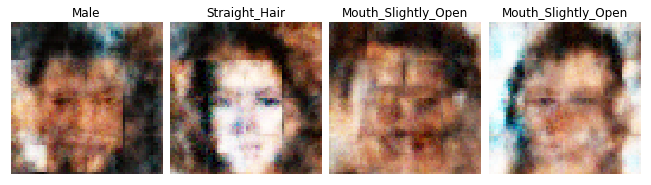

Iter: 2000; D loss: -34.67; G_loss: 3.311


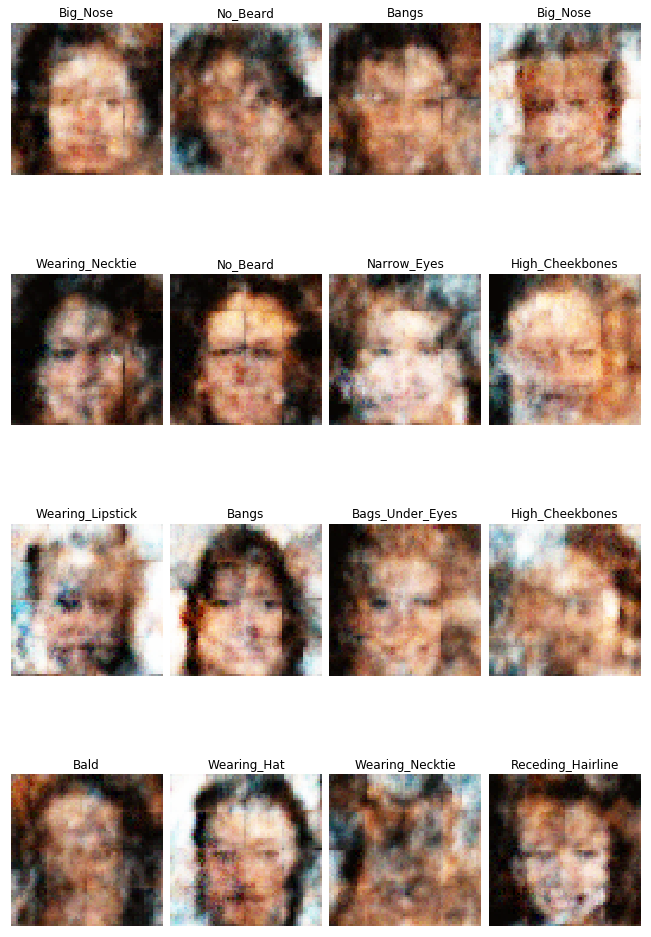

Iter: 2100; D loss: -36.8; G_loss: 13.35


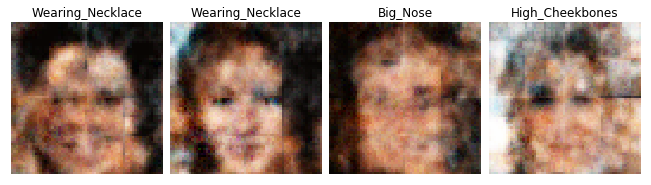

Iter: 2200; D loss: -35.86; G_loss: -1.147


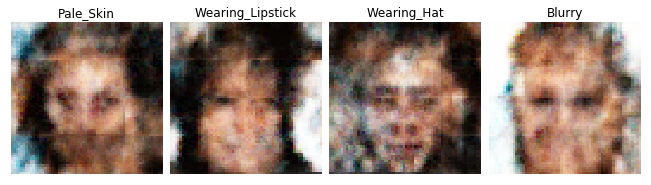

Iter: 2300; D loss: -29.93; G_loss: -28.11


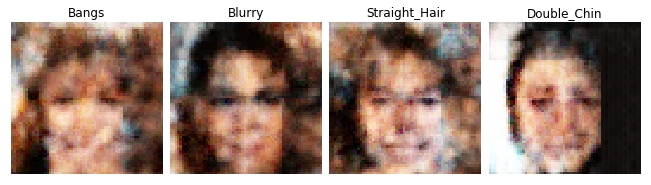

Iter: 2400; D loss: -30.53; G_loss: 15.06


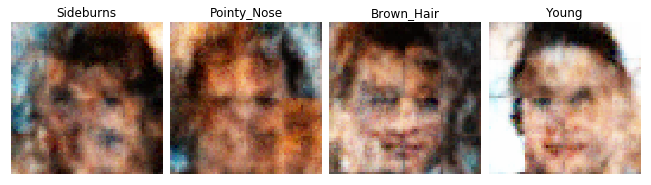

Iter: 2500; D loss: -29.63; G_loss: 4.975


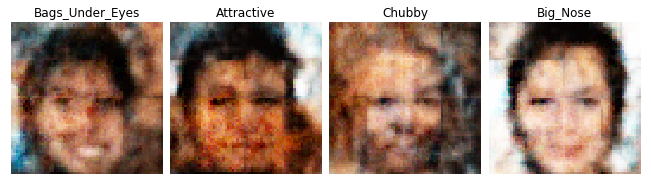

Iter: 2600; D loss: -30.32; G_loss: 31.03


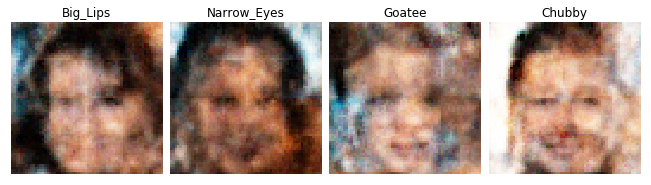

Iter: 2700; D loss: -24.19; G_loss: 13.57


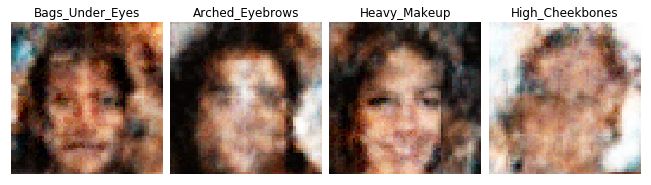

Iter: 2800; D loss: -30.18; G_loss: 17.22


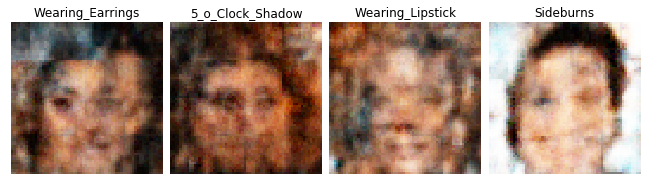

Iter: 2900; D loss: -25.28; G_loss: 15.45


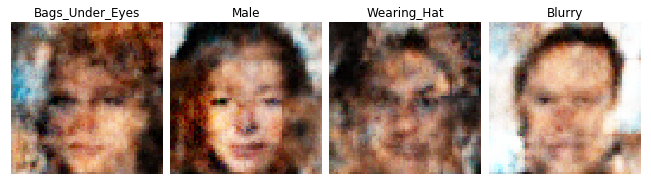

Iter: 3000; D loss: -24.08; G_loss: 41.32


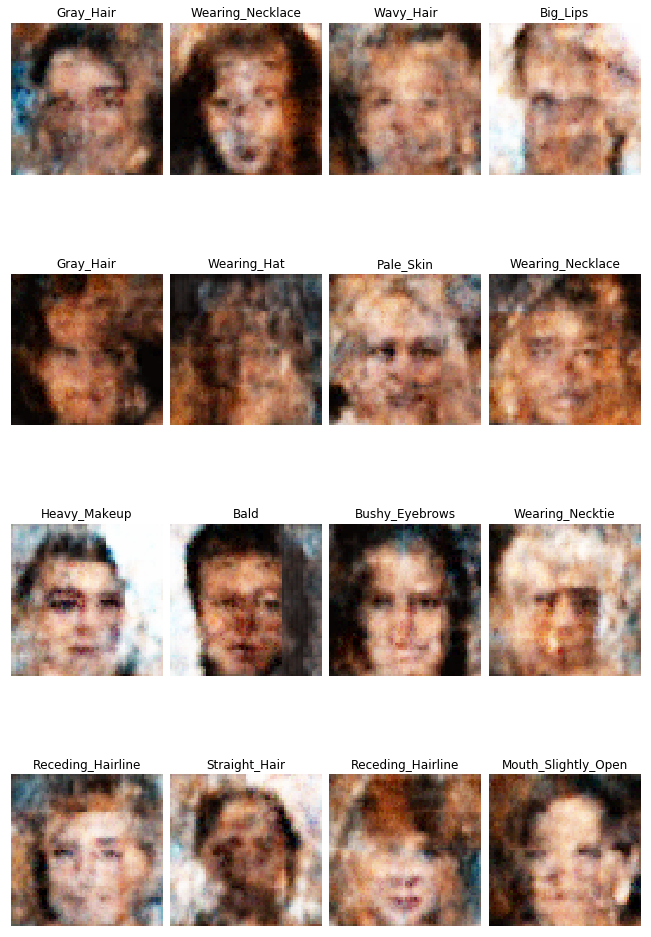

Iter: 3100; D loss: -26.58; G_loss: 22.99


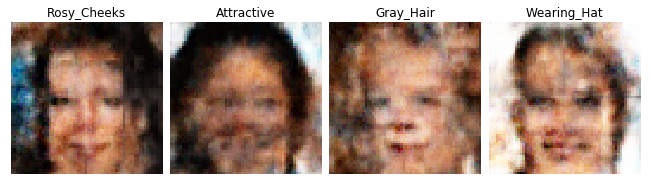

Iter: 3200; D loss: -24.92; G_loss: 25.32


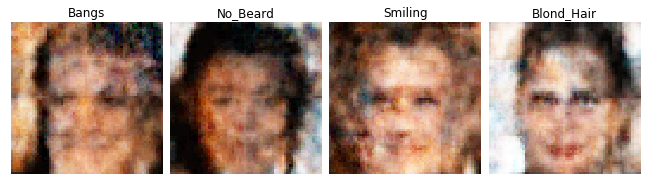

Iter: 3300; D loss: -23.69; G_loss: 7.509


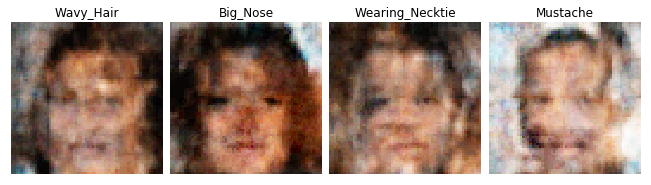

Iter: 3400; D loss: -22.2; G_loss: 37.46


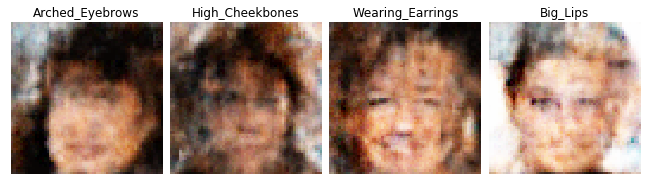

Iter: 3500; D loss: -16.94; G_loss: 4.527


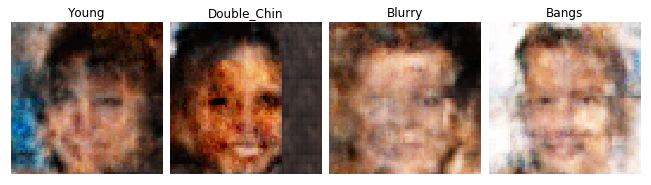

Iter: 3600; D loss: -14.55; G_loss: 23.7


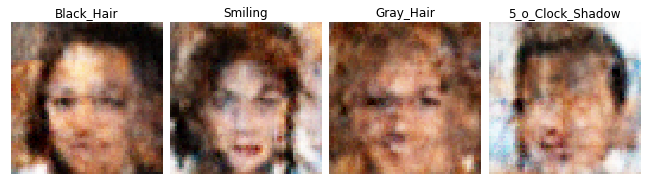

Iter: 3700; D loss: -17.55; G_loss: 13.31


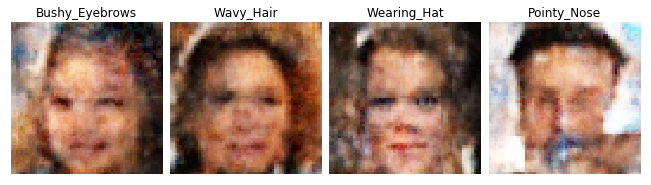

Iter: 3800; D loss: -20.92; G_loss: 8.682


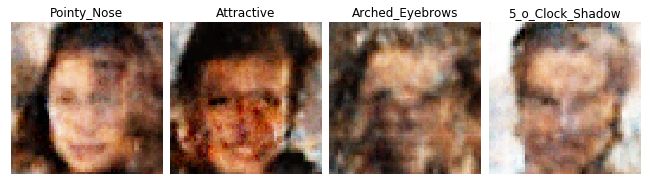

Iter: 3900; D loss: -19.81; G_loss: 17.57


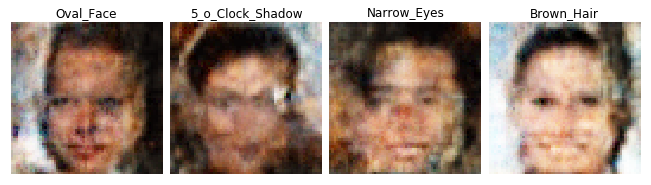

Iter: 4000; D loss: -23.64; G_loss: 15.4


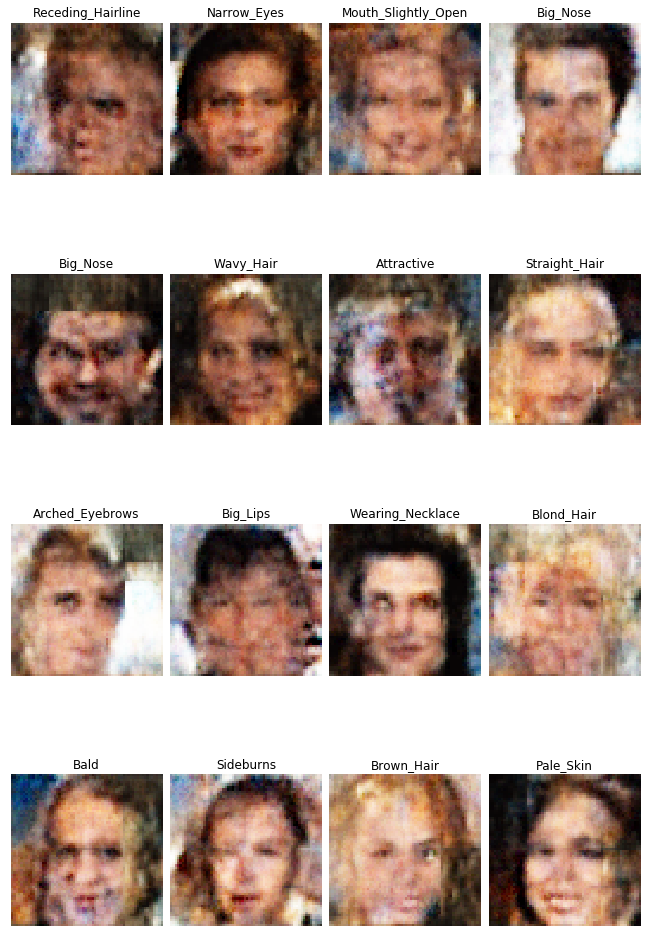

Iter: 4100; D loss: -24.79; G_loss: -2.757


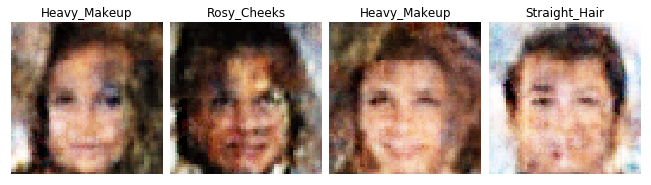

Iter: 4200; D loss: -23.76; G_loss: 32.18


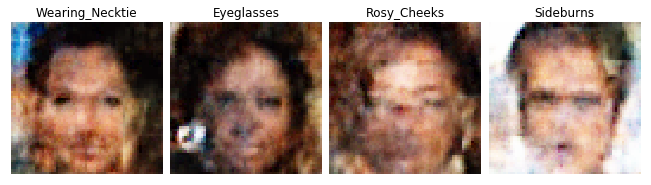

Iter: 4300; D loss: -17.89; G_loss: 30.95


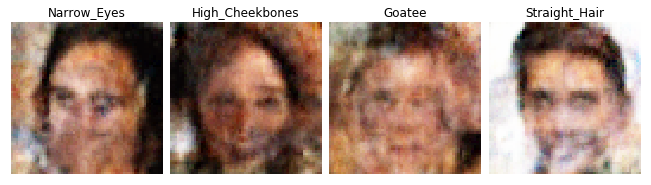

Iter: 4400; D loss: -20.19; G_loss: 16.04


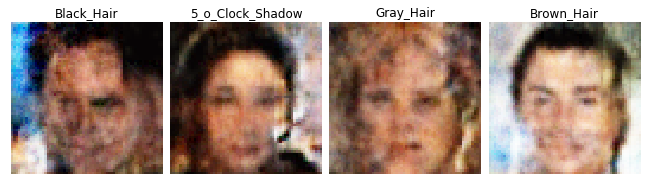

Iter: 4500; D loss: -18.73; G_loss: 13.06


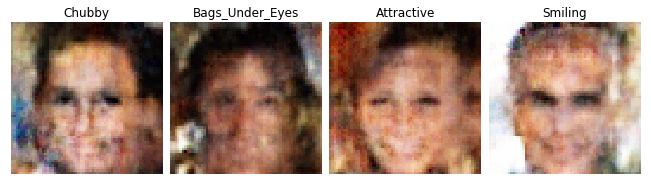

Iter: 4600; D loss: -16.1; G_loss: -0.6941


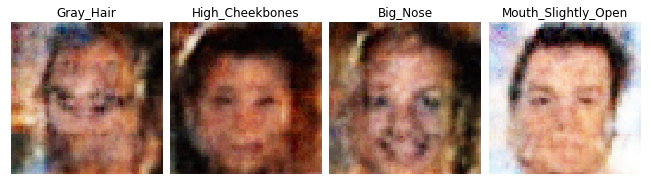

Iter: 4700; D loss: -21.57; G_loss: 13.2


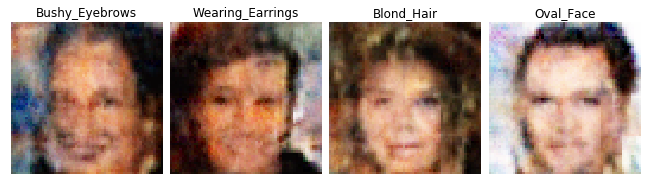

Iter: 4800; D loss: -19.53; G_loss: 30.44


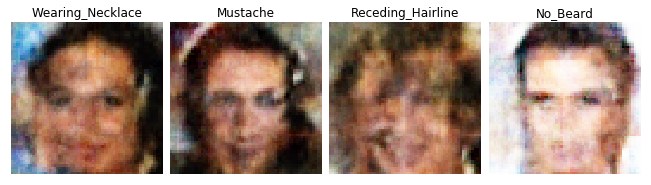

Iter: 4900; D loss: -21.31; G_loss: 10.15


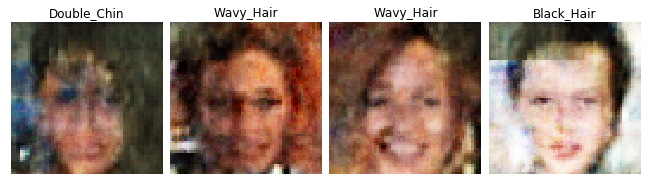

Iter: 5000; D loss: -23.16; G_loss: 38.14


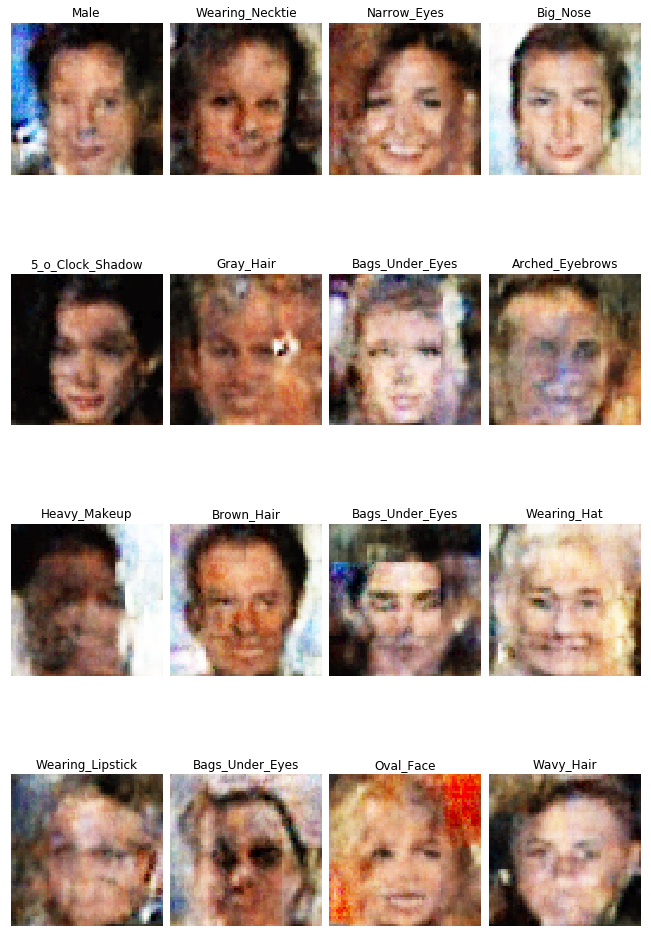

Iter: 5100; D loss: -18.37; G_loss: -17.59


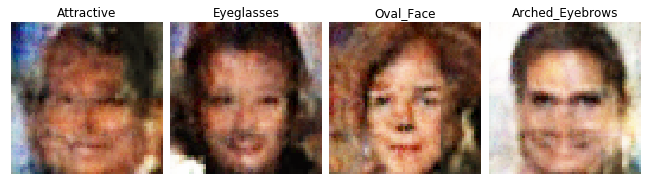

Iter: 5200; D loss: -24.57; G_loss: 5.979


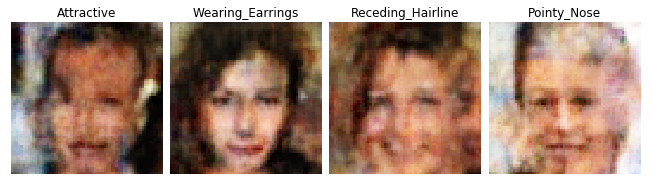

Iter: 5300; D loss: -17.17; G_loss: 5.956


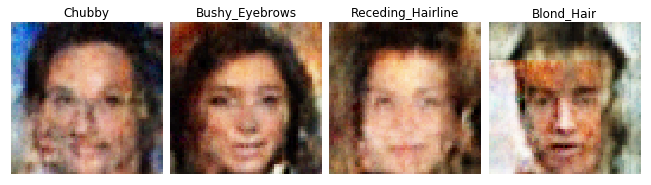

Iter: 5400; D loss: -12.88; G_loss: -13.01


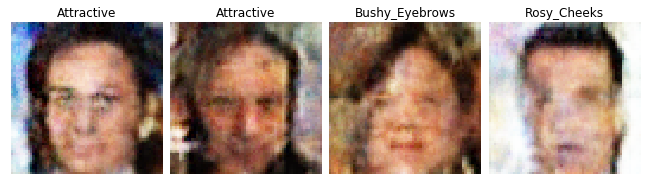

Iter: 5500; D loss: -7.691; G_loss: -4.287


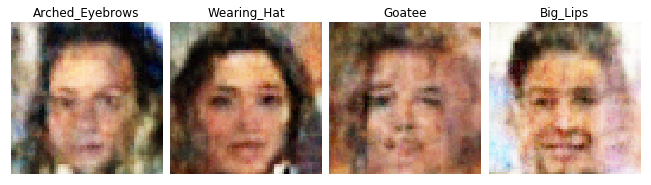

Iter: 5600; D loss: -17.89; G_loss: 12.6


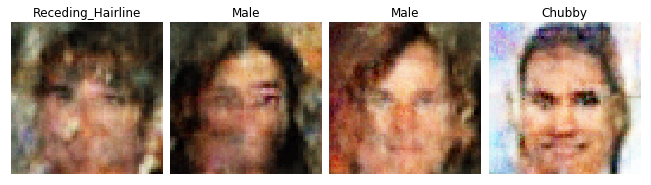

Iter: 5700; D loss: -21.16; G_loss: 8.595


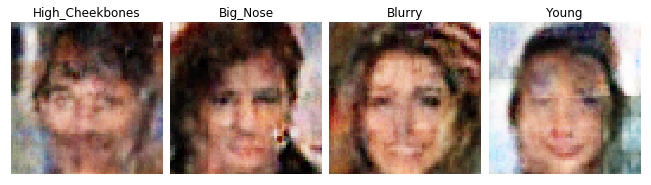

Iter: 5800; D loss: -17.53; G_loss: 6.851


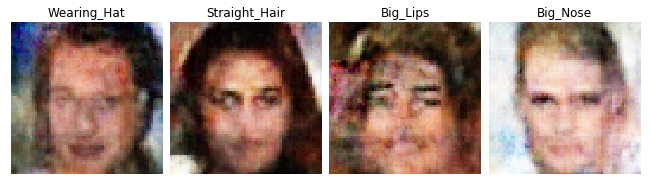

Iter: 5900; D loss: -18.55; G_loss: -5.08


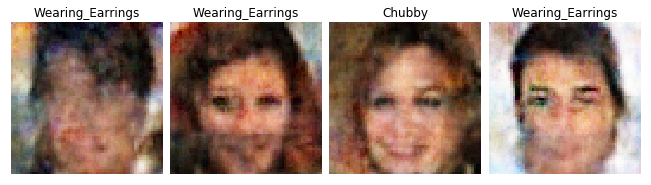

Iter: 6000; D loss: -19.9; G_loss: 3.65


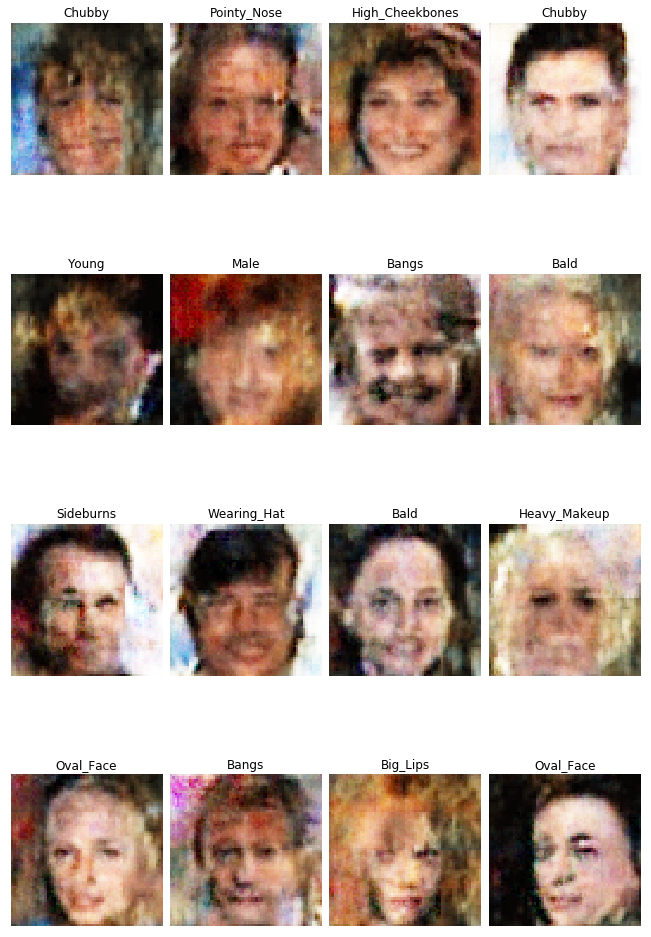

Iter: 6100; D loss: -19.71; G_loss: -19.1


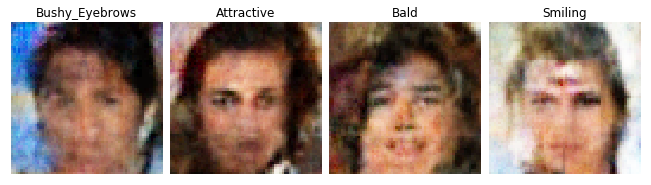

Iter: 6200; D loss: -18.22; G_loss: 12.18


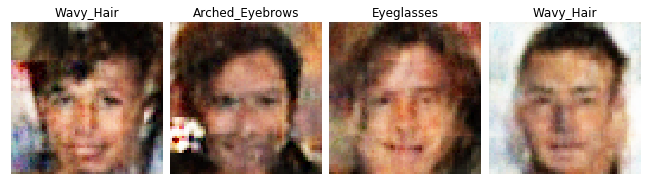

Iter: 6300; D loss: -18.05; G_loss: 3.704


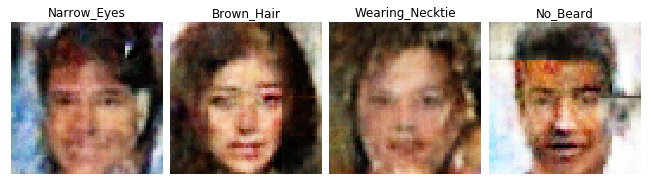

Iter: 6400; D loss: -17.64; G_loss: 7.314


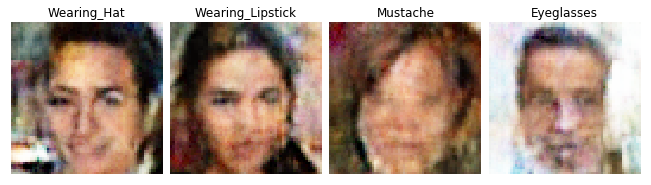

Iter: 6500; D loss: -13.46; G_loss: -10.38


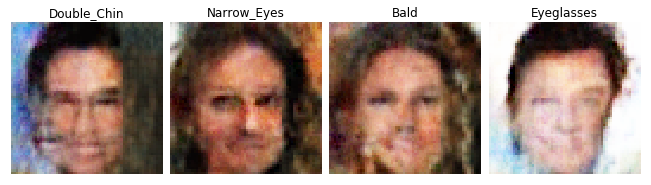

Iter: 6600; D loss: -19.14; G_loss: -0.6356


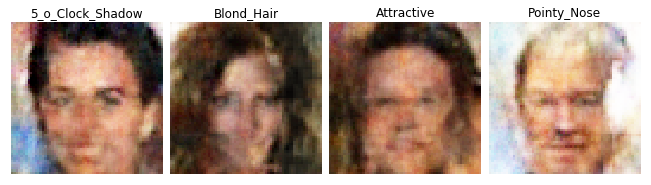

Iter: 6700; D loss: -20.72; G_loss: 30.26


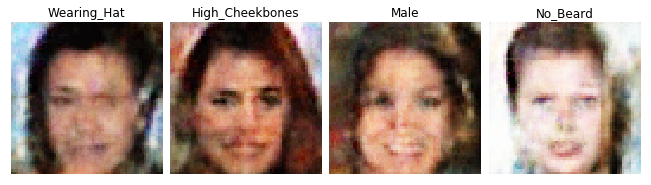

Iter: 6800; D loss: -21.63; G_loss: 9.29


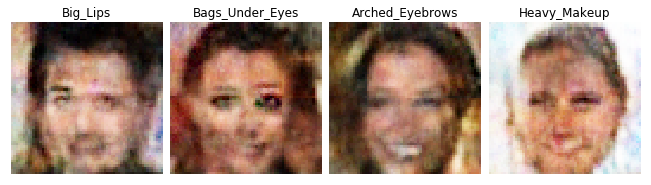

Iter: 6900; D loss: -16.26; G_loss: 9.707


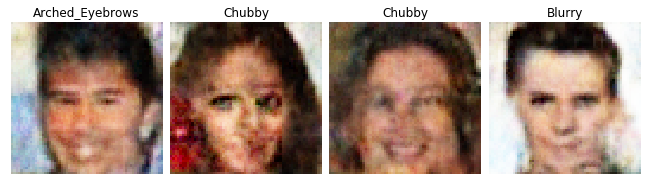

Iter: 7000; D loss: -17.54; G_loss: 6.916


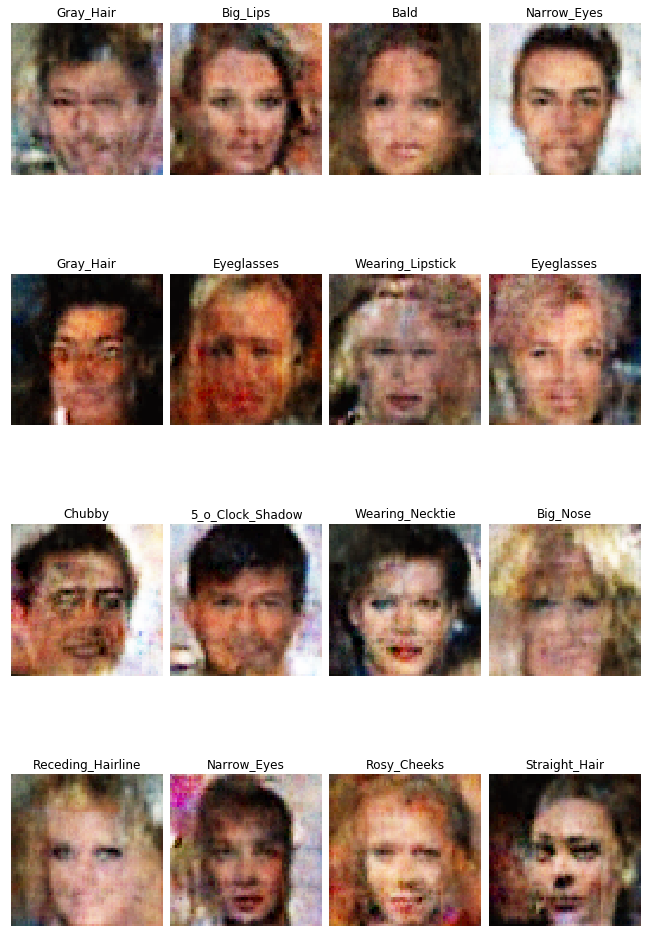

Iter: 7100; D loss: -20.43; G_loss: 1.365


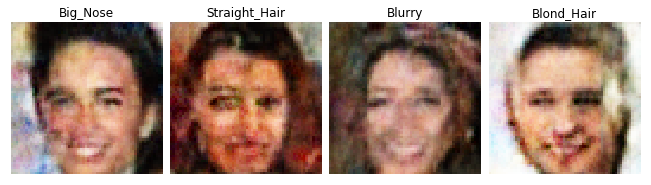

Iter: 7200; D loss: -23.39; G_loss: -9.876


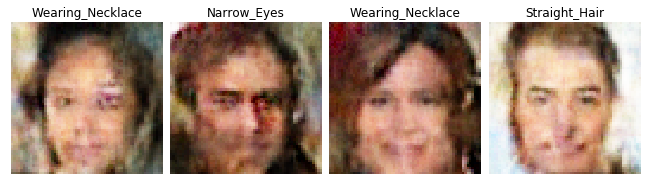

Iter: 7300; D loss: -17.89; G_loss: -10.7


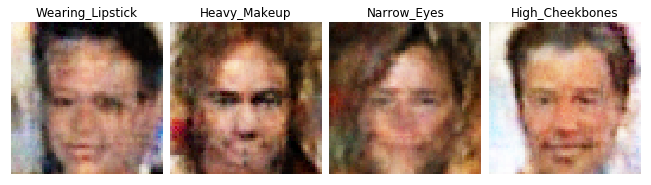

Iter: 7400; D loss: -21.47; G_loss: 14.33


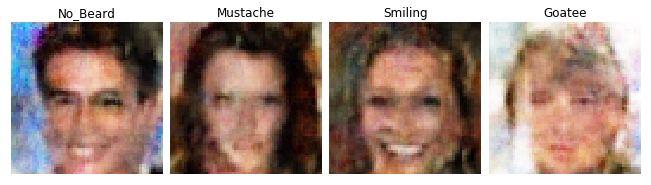

Iter: 7500; D loss: -19.56; G_loss: -2.583


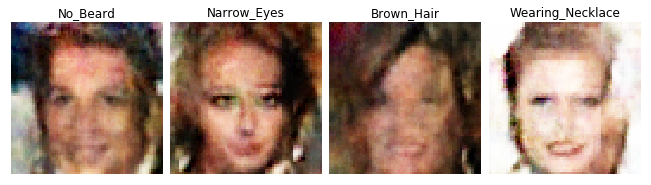

Iter: 7600; D loss: -19.02; G_loss: -29.87


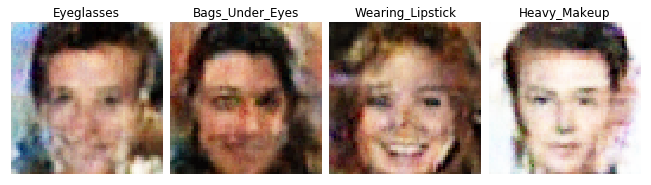

Iter: 7700; D loss: -20.05; G_loss: -29.19


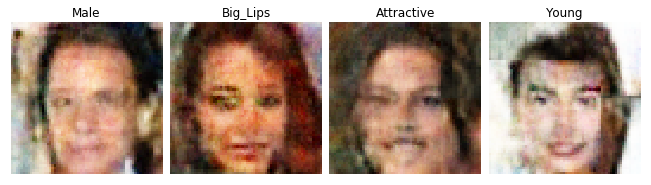

Iter: 7800; D loss: -21.2; G_loss: -4.642


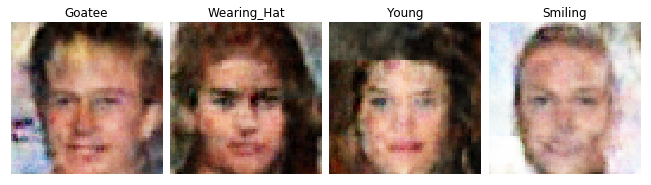

Iter: 7900; D loss: -20.3; G_loss: -7.743


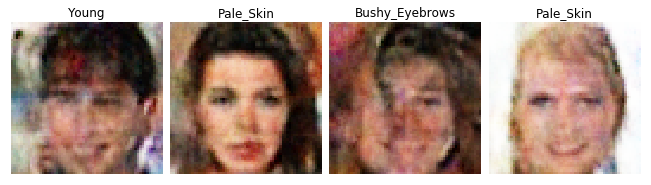

Iter: 8000; D loss: -15.58; G_loss: 12.96


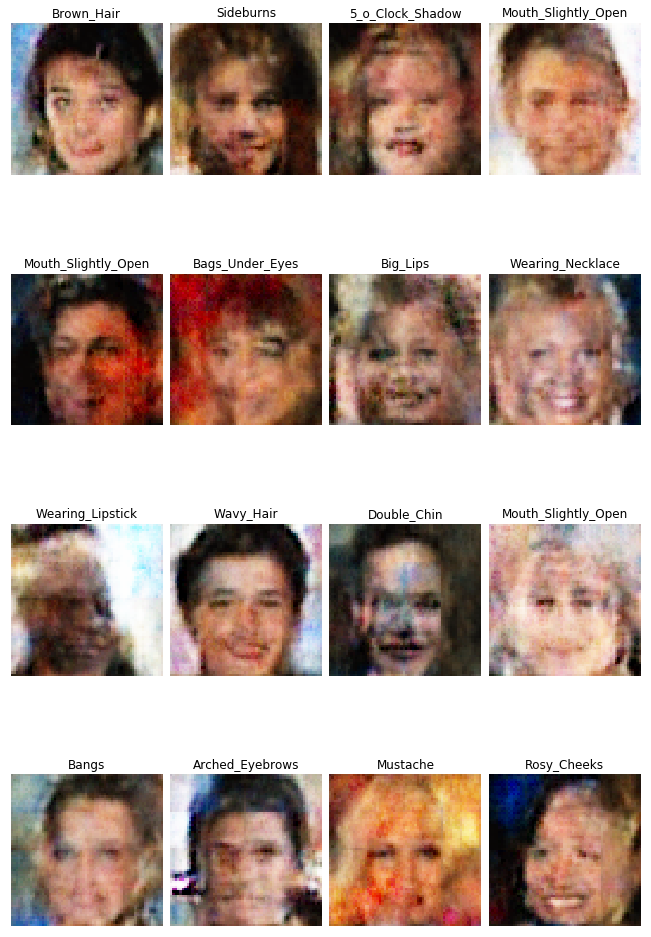

Iter: 8100; D loss: -14.23; G_loss: -2.537


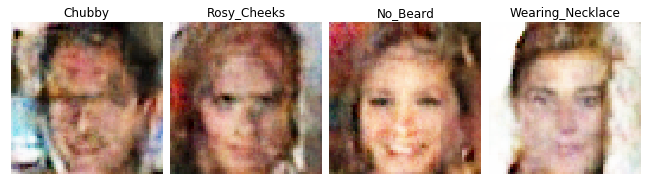

Iter: 8200; D loss: -17.32; G_loss: 12.53


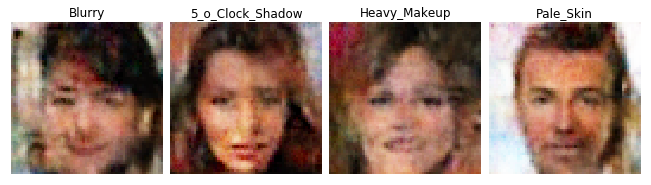

Iter: 8300; D loss: -16.29; G_loss: -27.34


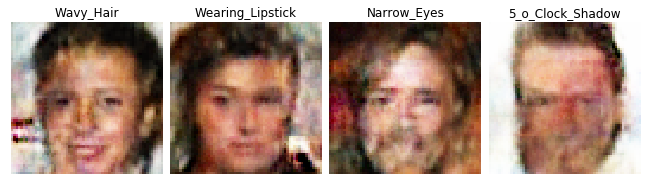

Iter: 8400; D loss: -21.88; G_loss: 12.7


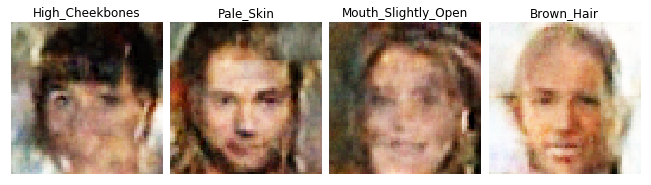

Iter: 8500; D loss: -19.98; G_loss: 7.237


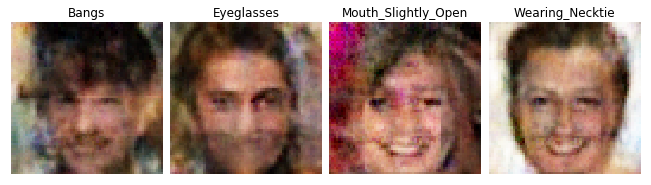

Iter: 8600; D loss: -20.95; G_loss: -26.32


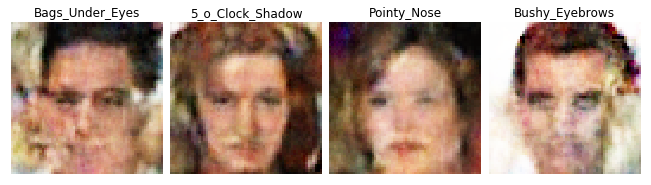

Iter: 8700; D loss: -16.78; G_loss: 0.4148


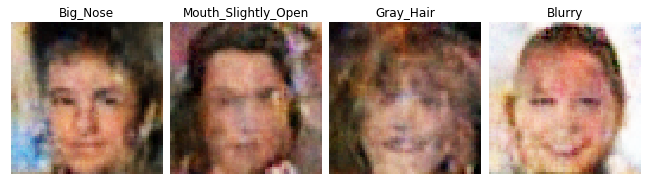

Iter: 8800; D loss: -19.94; G_loss: -0.6706


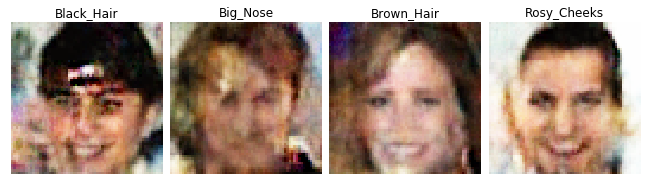

Iter: 8900; D loss: -19.2; G_loss: -27.33


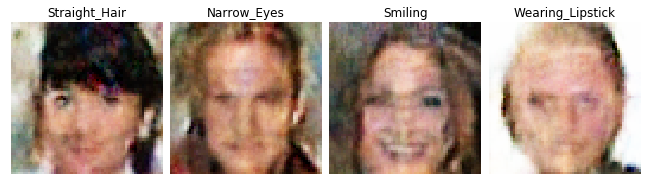

Iter: 9000; D loss: -18.42; G_loss: 22.55


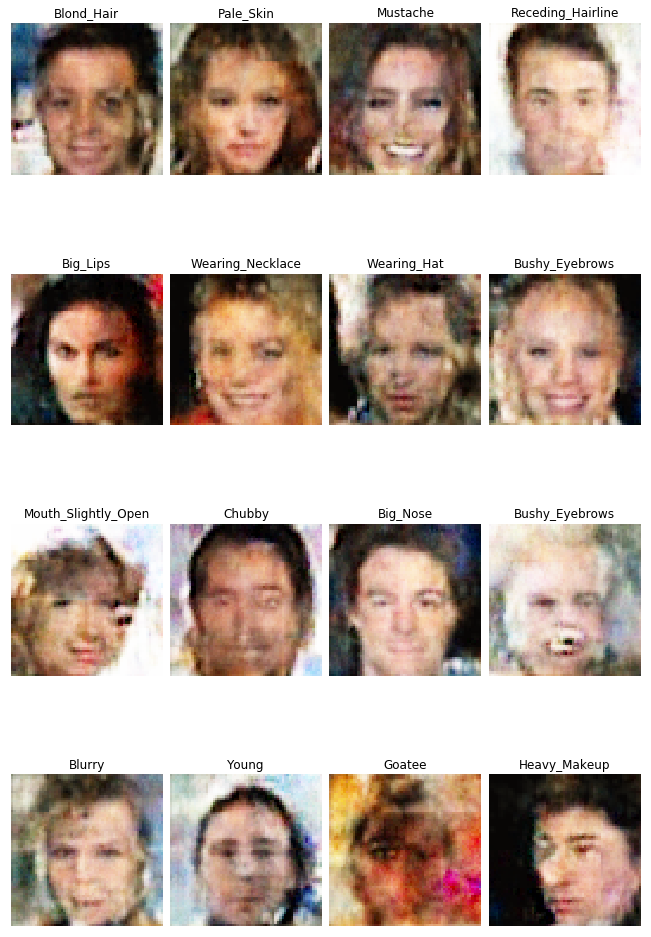

Iter: 9100; D loss: -11.85; G_loss: 7.562


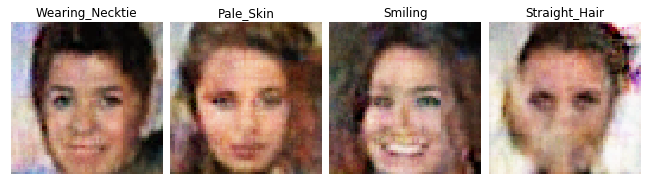

Iter: 9200; D loss: -15.18; G_loss: 8.896


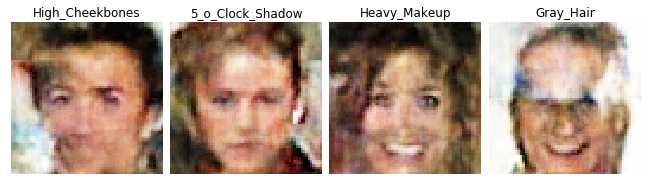

Iter: 9300; D loss: -24.17; G_loss: -19.91


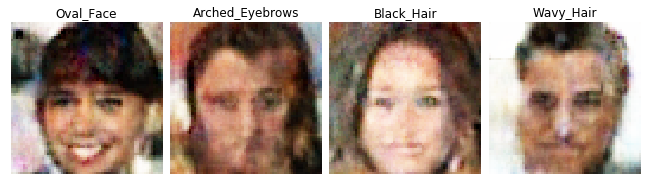

Iter: 9400; D loss: -20.44; G_loss: -40.94


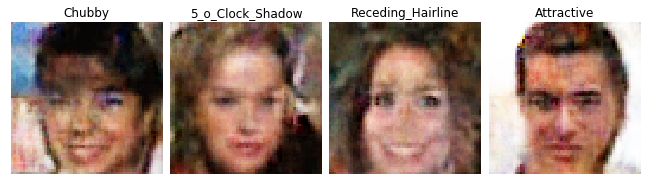

Iter: 9500; D loss: -12.54; G_loss: 4.651


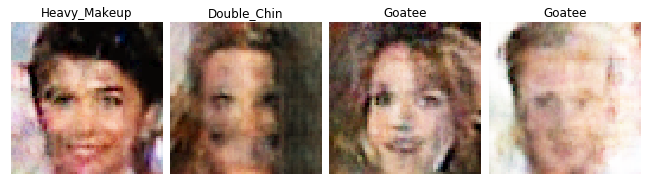

Iter: 9600; D loss: -16.02; G_loss: 12.06


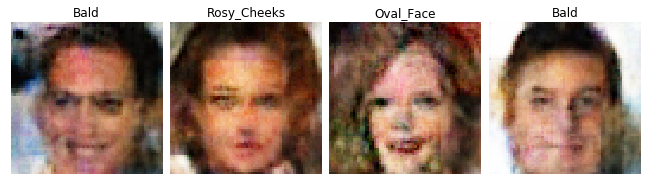

Iter: 9700; D loss: -9.009; G_loss: 18.26


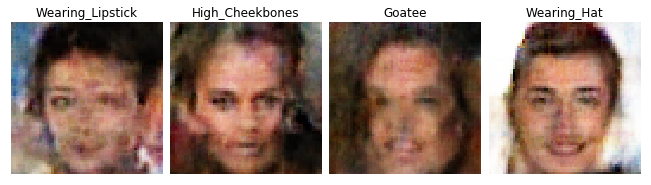

Iter: 9800; D loss: -20.94; G_loss: -18.67


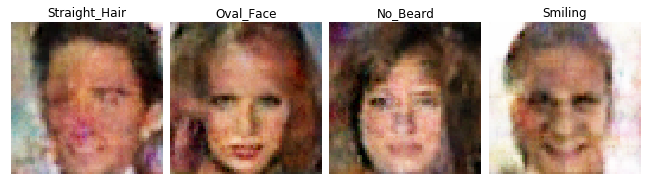

Iter: 9900; D loss: -11.69; G_loss: -2.32


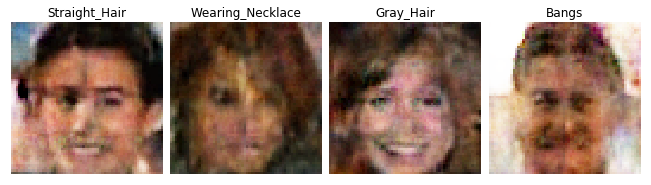

Iter: 10000; D loss: 1.104; G_loss: 29.93


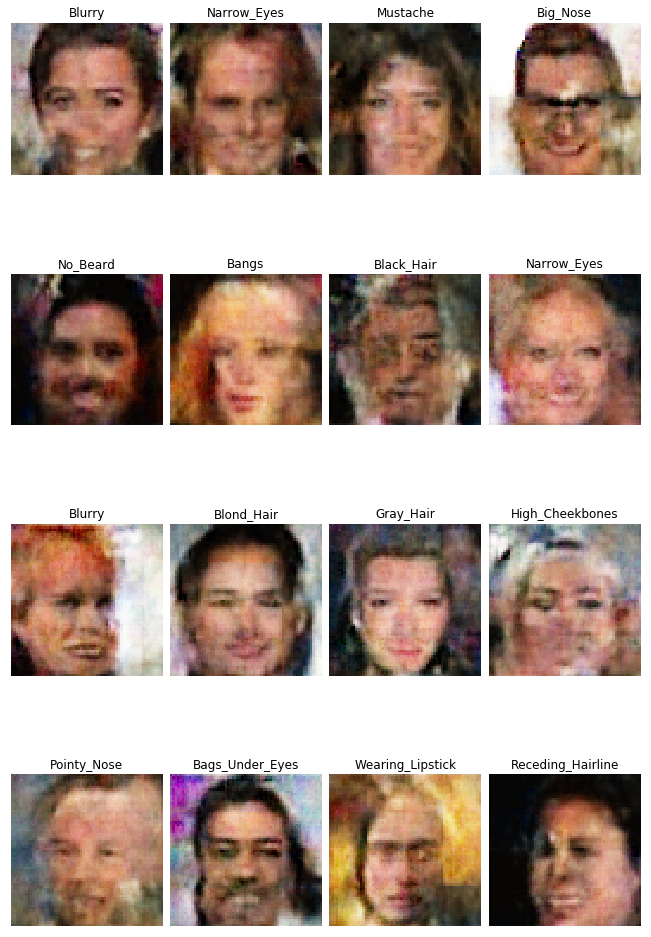

Iter: 10100; D loss: -25.18; G_loss: 13.14


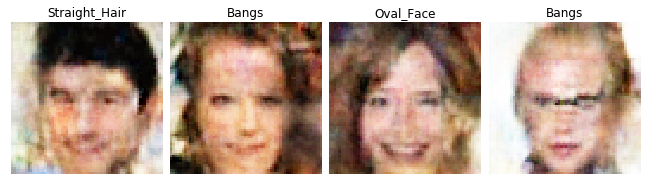

Iter: 10200; D loss: -22.0; G_loss: -26.52


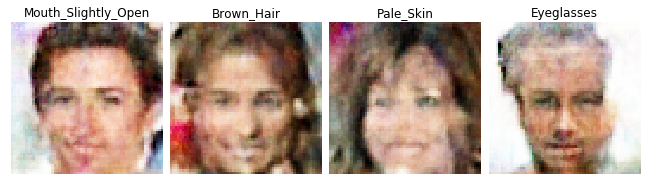

Iter: 10300; D loss: -21.41; G_loss: -17.95


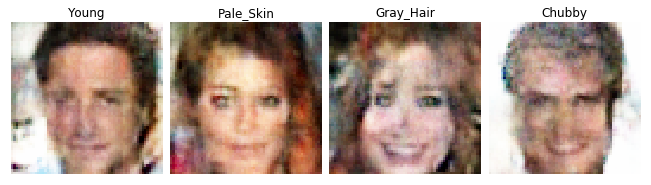

Iter: 10400; D loss: -18.29; G_loss: 24.44


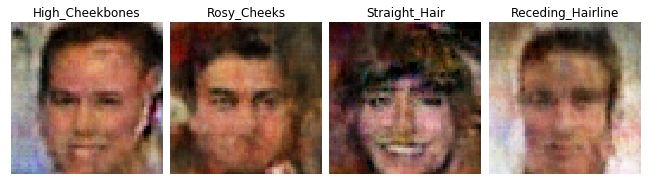

Iter: 10500; D loss: -19.19; G_loss: -10.35


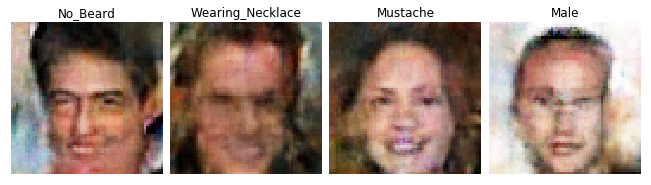

Iter: 10600; D loss: -20.83; G_loss: -12.1


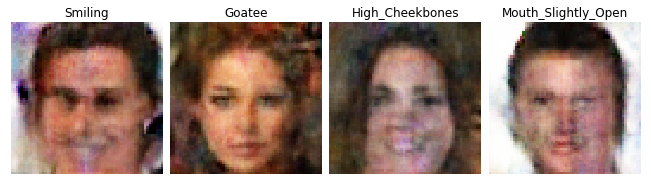

Iter: 10700; D loss: -19.35; G_loss: 7.423


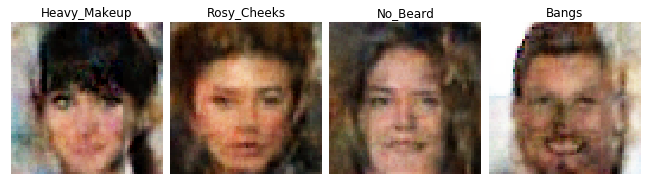

Iter: 10800; D loss: -15.44; G_loss: -13.69


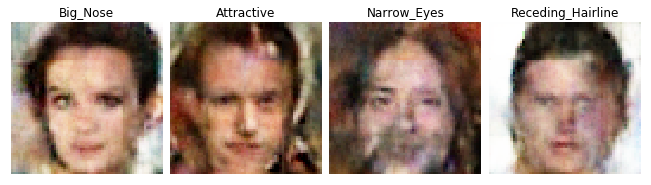

Iter: 10900; D loss: -11.7; G_loss: 12.24


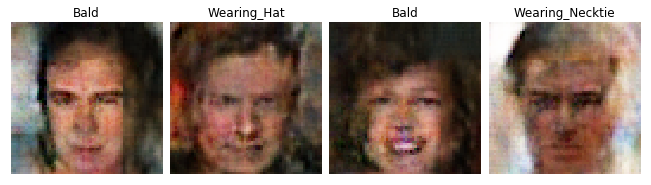

Iter: 11000; D loss: -21.22; G_loss: -23.85


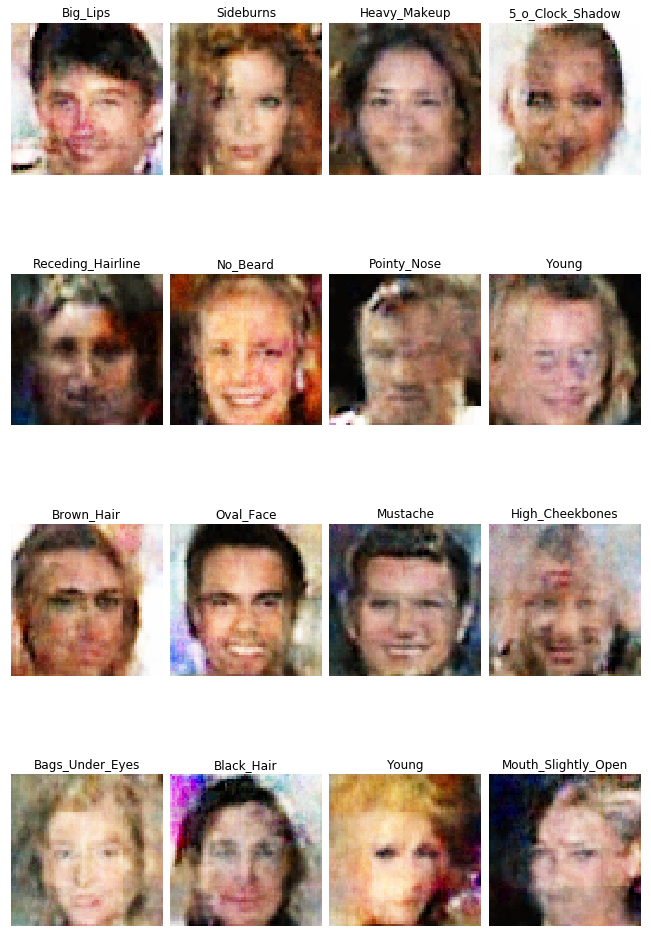

Iter: 11100; D loss: -2.23; G_loss: 9.615


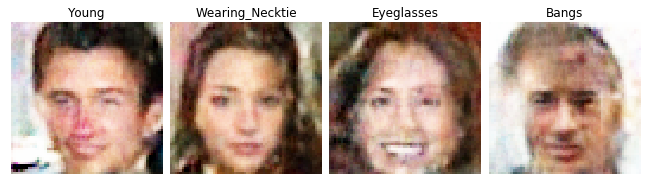

Iter: 11200; D loss: -15.57; G_loss: 25.35


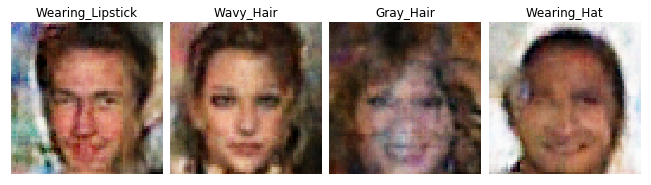

Iter: 11300; D loss: -10.83; G_loss: -6.824


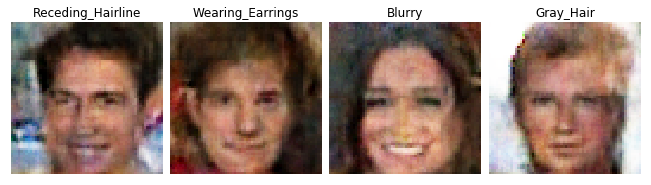

Iter: 11400; D loss: -15.94; G_loss: -18.53


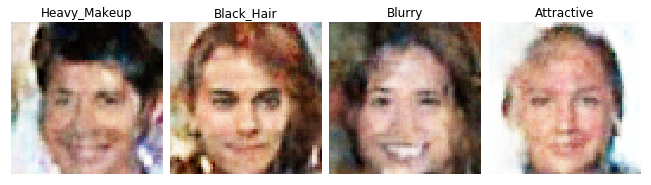

Iter: 11500; D loss: -19.22; G_loss: -31.84


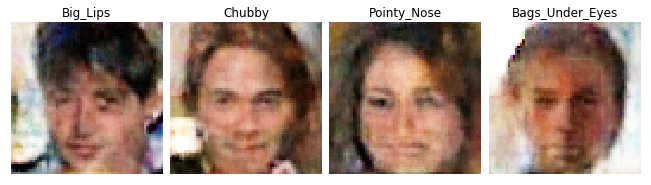

In [ ]:
i = 0
d_costs = []
g_costs = []
for it in range(100000):
    for q in range(5): #train discriminator
        Xdata = getImageBatch()
        z = sample_z(batch_size) #get Image Batch+Labels
        mean_image,attr = getMeanImage(batch_size) #get mean_image
        _, D_loss_curr = sess.run(
            [D_solver, D_loss],
            feed_dict={X: Xdata, Z:z, Mean_image:mean_image,Class_z:attr}
        )
        d_costs.append(D_loss_curr)
    z = sample_z(batch_size) #get Image Batch+Labels
    mean_image,attr = getMeanImage(batch_size) #get mean_image
    _, G_loss_curr = sess.run(
        [G_solver, G_loss],
        feed_dict={Z:z, Mean_image:mean_image,Class_z:attr}
    )
    g_costs.append(G_loss_curr)
    if it % 100 == 0:
        print('Iter: {}; D loss: {:.4}; G_loss: {:.4}'
              .format(it, D_loss_curr, G_loss_curr))
        if it % 1000 == 0:
            z = sample_z(batch_size) #get Image Batch+Labels
            mean_image,attr = getMeanImage(batch_size) #get mean_image
            samples = sess.run(detail_image, feed_dict={Z:z,Mean_image:mean_image,Class_z:attr})         
            samples[0] = np.reshape(samples[0], (batch_size,64,64,3))
            fig = plot(samples[0][:16], createAttributesFromVector(attr),4,4)
            plt.savefig('out-celebA/{}.png'
                        .format(str(i).zfill(3)), bbox_inches='tight')
            plt.show()
            i += 1
        else:
            z = sample_z(batch_size) #get Image Batch+Labels
            mean_image,attr = getMeanImage(batch_size) #get mean_image
            samples = sess.run(detail_image, feed_dict={Z:z,Mean_image:mean_image,Class_z:attr})         
            samples[0] = np.reshape(samples[0], (batch_size,imY,imX,3))
            fig = plot(samples[0][:4],createAttributesFromVector(attr),1,4)
            plt.show()
            
plt.close(fig)

In [ ]:
plt.plot(d_costs[500:_])
plt.ylabel('D_Loss')
plt.show()
plt.savefig('out-celebA/DLoss.png'
                        .format(str(i).zfill(3)), bbox_inches='tight')

plt.plot(g_costs[500:_])
plt.ylabel('G_Loss')
plt.show()
plt.savefig('out-celebA/GLoss.png'
                        .format(str(i).zfill(3)), bbox_inches='tight')